In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!pip install git+https://github.com/lucasb-eyer/pydensecrf.git

  Cloning https://github.com/lucasb-eyer/pydensecrf.git to /tmp/pip-req-build-4ce4okus
  Running command git clone --filter=blob:none --quiet https://github.com/lucasb-eyer/pydensecrf.git /tmp/pip-req-build-4ce4okus
  Resolved https://github.com/lucasb-eyer/pydensecrf.git to commit 2723c7fa4f2ead16ae1ce3d8afe977724bb8f87f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pydensecrf: filename=pydensecrf-1.0-cp311-cp311-linux_x86_64.whl size=3440331 sha256=a112ffe4260b782174449782c3b363a8fdf26e7352e98e0454c0f378ffc2ea62
  Stored in directory: /tmp/pip-ephem-wheel-cache-95y2a02n/wheels/ce/8e/34/6dcfa200a9e2ae3627d8009b8bd1ca9b24512bec50a93304de
Successfully built pydensecrf


In [2]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.util import img_as_ubyte
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import unary_from_softmax
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import shutil
from IPython.display import FileLink

2025-04-13 15:22:48.943014: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744557769.170528      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744557769.236937      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Pre-processing

In [3]:
# Basic image processing functions
def apply_histogram_equalization(image):
    return exposure.equalize_hist(image)

def apply_clahe(image):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(image)

def apply_image_complement(image):
    return cv2.bitwise_not(image)

In [4]:
def apply_crf(img, mask, n_classes=2):
    """Apply DenseCRF to refine segmentation mask"""
    # Convert grayscale to 3-channel if needed
    if len(img.shape) == 2:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    
    img = np.ascontiguousarray(img)
    mask = np.ascontiguousarray(mask)
    
    d = dcrf.DenseCRF2D(img.shape[1], img.shape[0], n_classes)
    U = unary_from_softmax(np.stack([1-mask, mask], axis=0))
    d.setUnaryEnergy(U)
    
    d.addPairwiseGaussian(sxy=3, compat=3)
    d.addPairwiseBilateral(sxy=10, srgb=13, rgbim=img, compat=10)
    
    Q = d.inference(5)
    return np.argmax(Q, axis=0).reshape(img.shape[:2])

In [5]:
def preprocess_image(image_path, mask_path=None):
    # Load the image in color (3 channels) for CRF
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Image enhancements (on grayscale)
    enhanced_image = apply_histogram_equalization(gray_image)
    clahe_image = apply_clahe(gray_image)
    complemented_image = apply_image_complement(gray_image)
    
    # Segmentation
    if mask_path:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask.shape != gray_image.shape:
            mask = cv2.resize(mask, (gray_image.shape[1], gray_image.shape[0]))
        
        # Use original color image for CRF
        crf_refined_mask = apply_crf(image, mask/255.0)
        crf_refined_mask = (crf_refined_mask * 255).astype(np.uint8)
        
        segmented_image = cv2.bitwise_and(gray_image, gray_image, mask=mask)
        crf_segmented_image = cv2.bitwise_and(gray_image, gray_image, mask=crf_refined_mask)
    else:
        segmented_image = gray_image
        crf_segmented_image = gray_image
    
    # Resizing
    resized_image = cv2.resize(segmented_image, (224, 224))
    resized_crf_image = cv2.resize(crf_segmented_image, (224, 224))
    
    return gray_image, enhanced_image, clahe_image, complemented_image, segmented_image, crf_segmented_image, resized_image, resized_crf_image

In [6]:
def process_folder(image_folder, mask_folder=None, output_folder=None, category_name="", num_samples=3):
    # Create output directories
    steps = ['original', 'enhanced', 'clahe', 'complemented', 
             'segmented', 'crf_segmented', 'resized', 'resized_crf']
    for step in steps:
        os.makedirs(os.path.join(output_folder, step), exist_ok=True)    
        
    sample_count = 0    
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        mask_path = os.path.join(mask_folder, image_name) if mask_folder else None
        
        # Process image
        outputs = preprocess_image(image_path, mask_path)
        
        # Save all versions
        for step, img in zip(steps, outputs):
            cv2.imwrite(os.path.join(output_folder, step, image_name), img)
        
        # Display samples
        if sample_count < num_samples:
            print(f"Displaying samples for {category_name} - Image: {image_name}")
            plt.figure(figsize=(20, 15))
            
            for i, (title, img) in enumerate(zip(steps, outputs)):
                plt.subplot(2, 4, i+1)
                plt.title(title)
                plt.imshow(img, cmap='gray')
            
            plt.tight_layout()
            plt.show()
            sample_count += 1

In [7]:
class CRFAttentionBlock(Layer):
    def __init__(self, filters, **kwargs):
        super(CRFAttentionBlock, self).__init__(**kwargs)
        self.filters = filters
        self.conv1 = Conv2D(filters, 1, activation='relu')
        self.conv2 = Conv2D(filters, 1, activation='sigmoid')
        
    def call(self, inputs):
        x, g = inputs
        theta_x = self.conv1(x)
        phi_g = self.conv1(g)
        concat = tf.concat([theta_x, phi_g], axis=-1)
        
        pairwise = Conv2D(1, 1, activation='relu')(concat)
        pairwise = tf.nn.softmax(pairwise, axis=[1,2])
        return Multiply()([x, pairwise])

def build_crf_unet(input_shape=(224, 224, 1)):
    inputs = Input(input_shape)
    
    # Encoder
    c1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, 3, activation='relu', padding='same')(p1)
    p2 = MaxPooling2D((2, 2))(c2)
    
    # Bottleneck
    c3 = Conv2D(256, 3, activation='relu', padding='same')(p2)
    
    # Decoder with CRF Attention
    u1 = UpSampling2D((2, 2))(c3)
    attn1 = CRFAttentionBlock(128)([c2, u1])
    concat1 = Concatenate()([u1, attn1])
    c4 = Conv2D(128, 3, activation='relu', padding='same')(concat1)
    
    u2 = UpSampling2D((2, 2))(c4)
    attn2 = CRFAttentionBlock(64)([c1, u2])
    concat2 = Concatenate()([u2, attn2])
    c5 = Conv2D(64, 3, activation='relu', padding='same')(concat2)
    
    outputs = Conv2D(1, 1, activation='sigmoid')(c5)
    return Model(inputs, outputs)

Processing COVID...


[ WARN:0@73.296] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.


Displaying samples for COVID - Image: COVID-1994.png


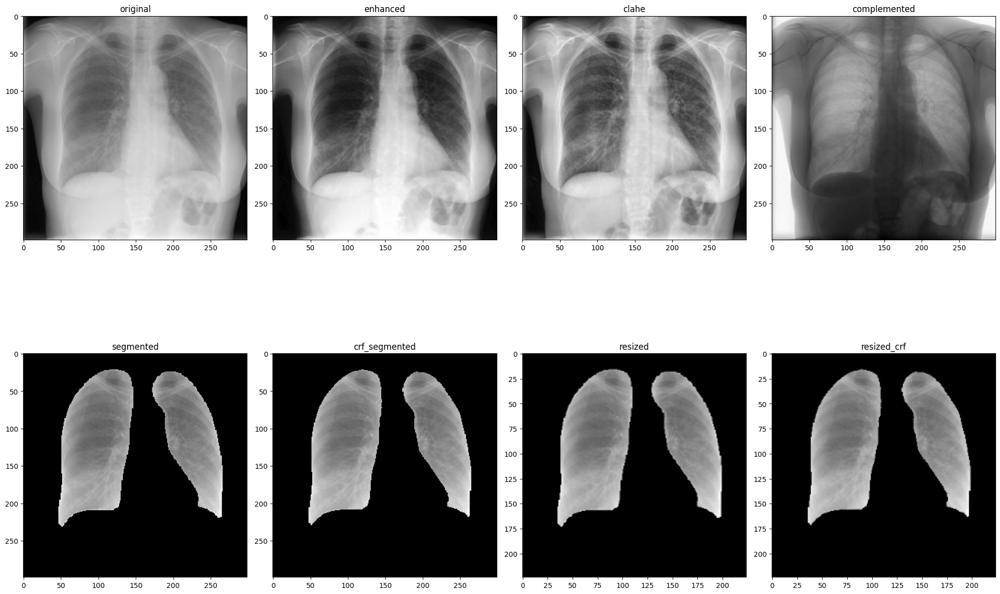

Displaying samples for COVID - Image: COVID-1825.png


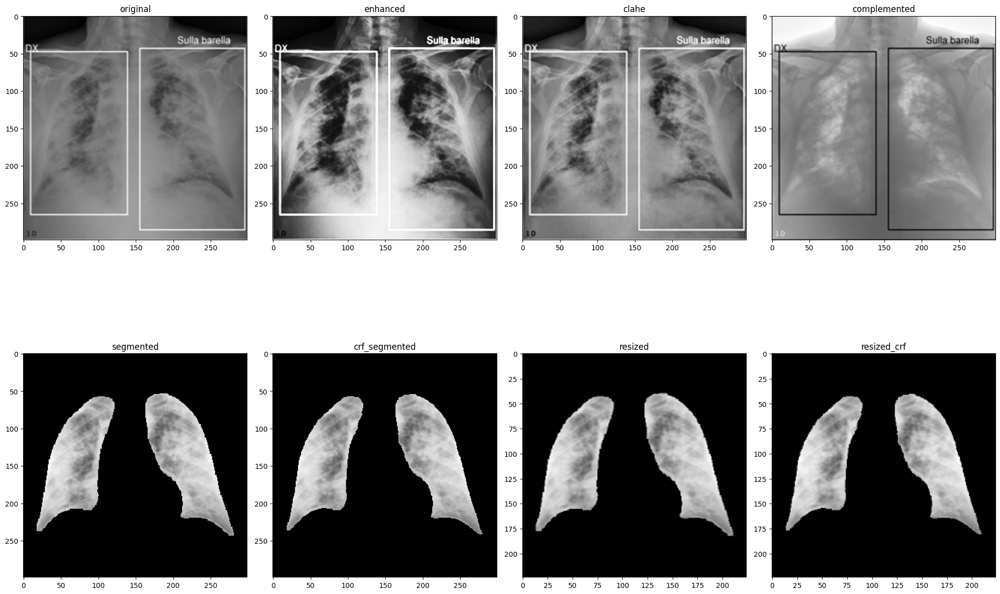

Displaying samples for COVID - Image: COVID-517.png


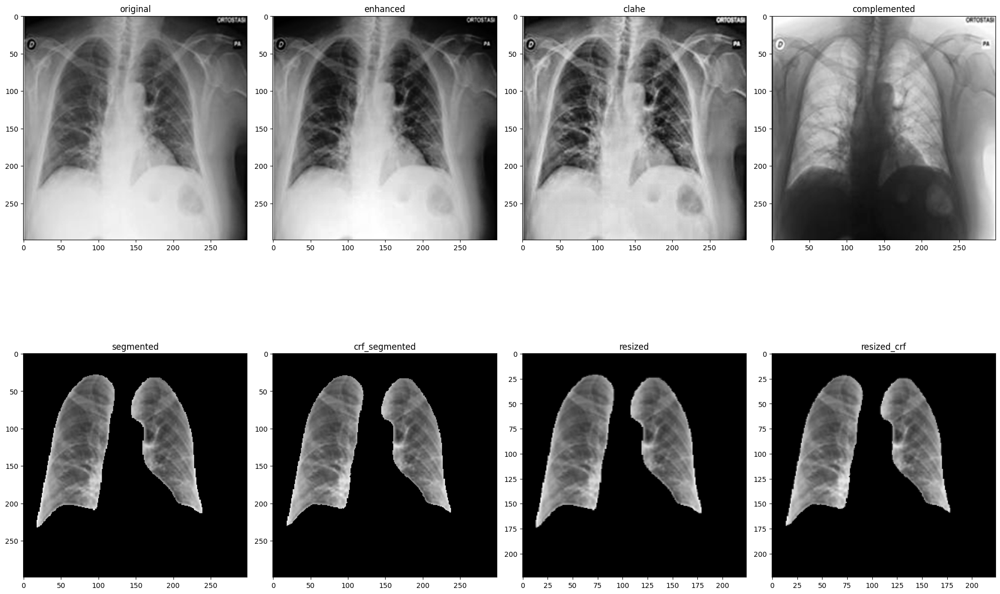

Processing Lung_Opacity...
Displaying samples for Lung_Opacity - Image: Lung_Opacity-35.png


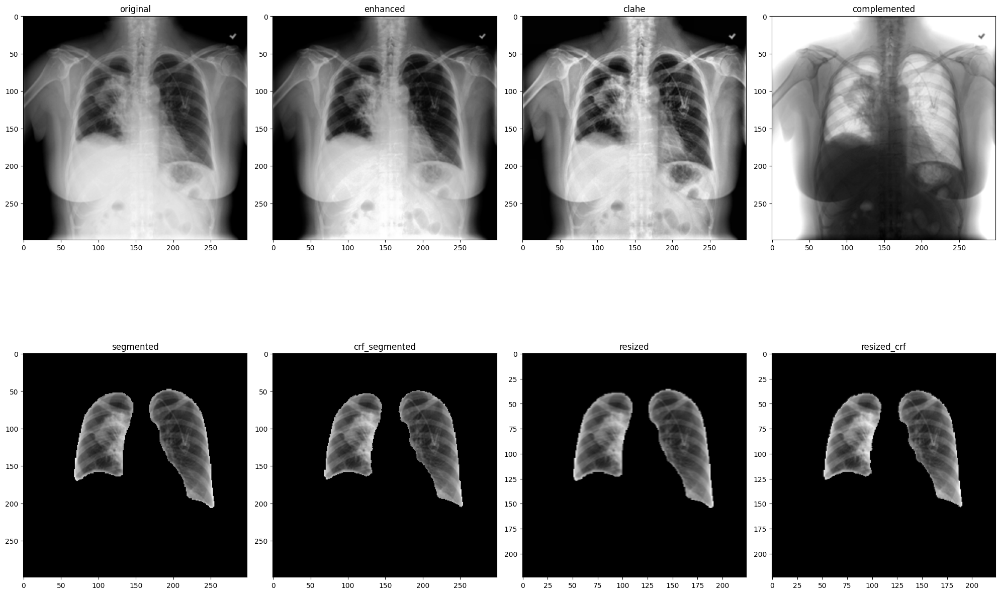

Displaying samples for Lung_Opacity - Image: Lung_Opacity-1075.png


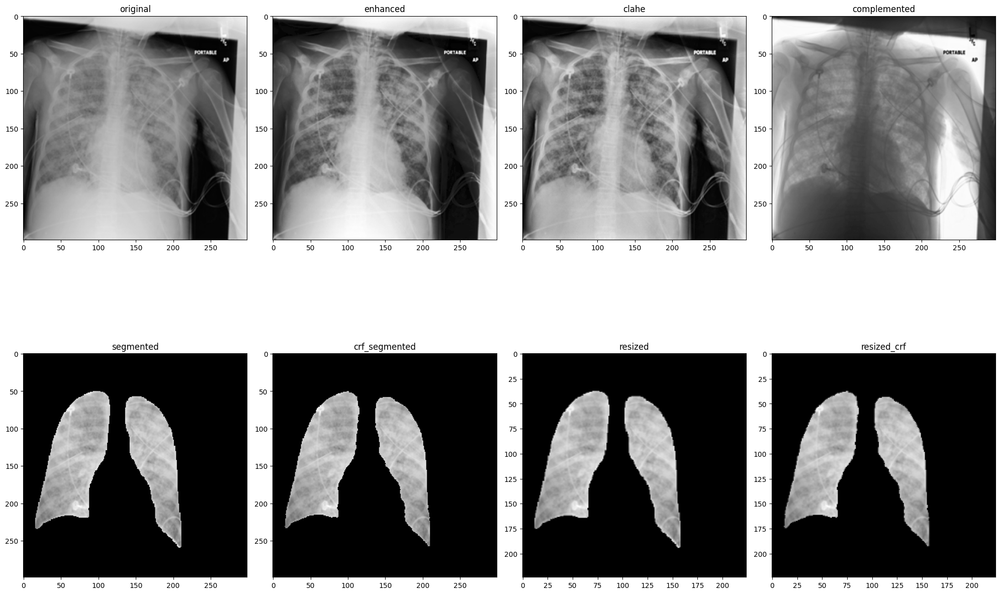

Displaying samples for Lung_Opacity - Image: Lung_Opacity-4459.png


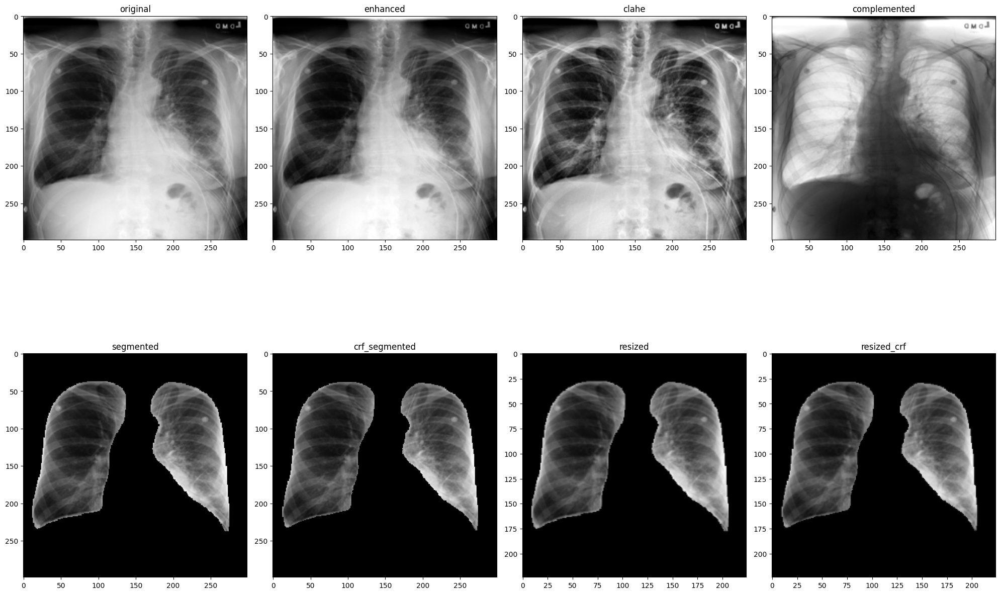

Processing Normal...
Displaying samples for Normal - Image: Normal-859.png


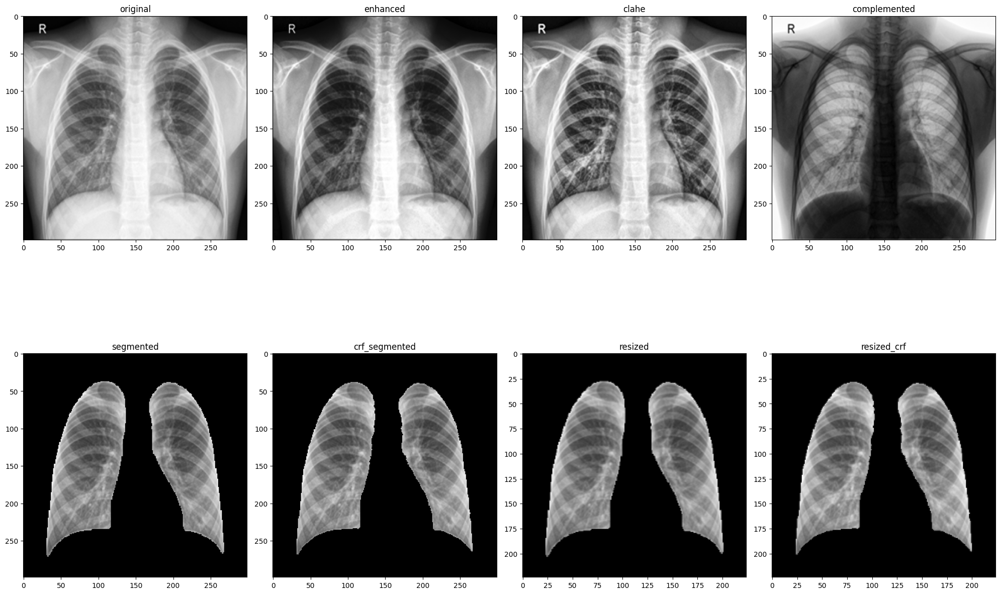

Displaying samples for Normal - Image: Normal-158.png


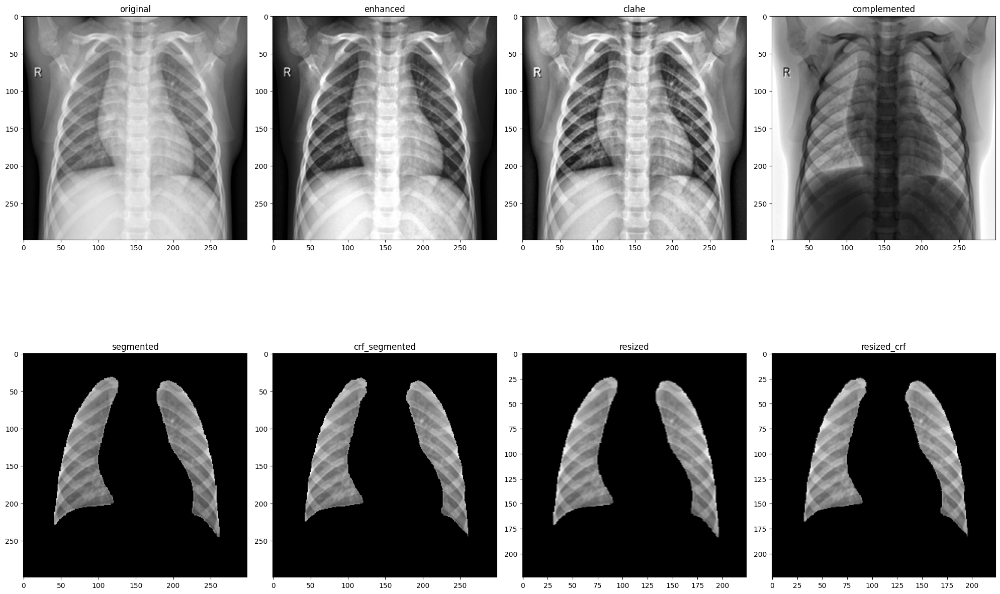

Displaying samples for Normal - Image: Normal-10121.png


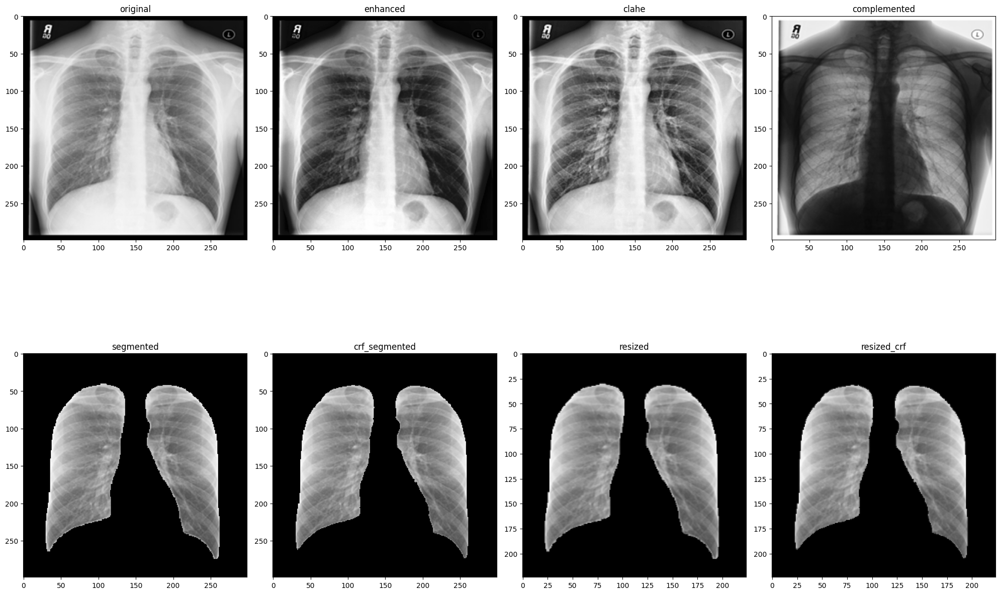

Processing Viral_Pneumonia...
Displaying samples for Viral_Pneumonia - Image: Viral Pneumonia-1310.png


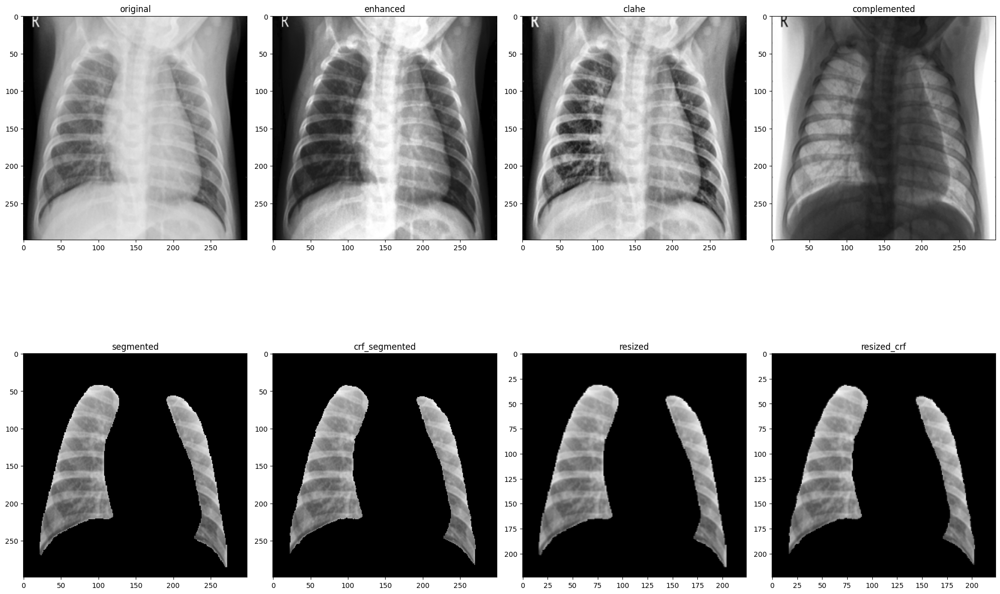

Displaying samples for Viral_Pneumonia - Image: Viral Pneumonia-1144.png


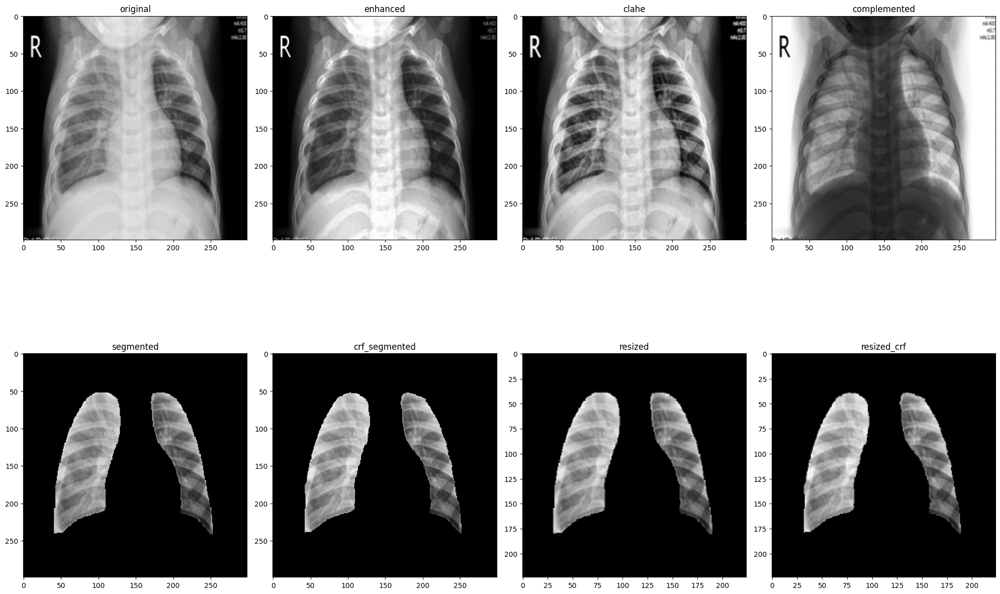

Displaying samples for Viral_Pneumonia - Image: Viral Pneumonia-1022.png


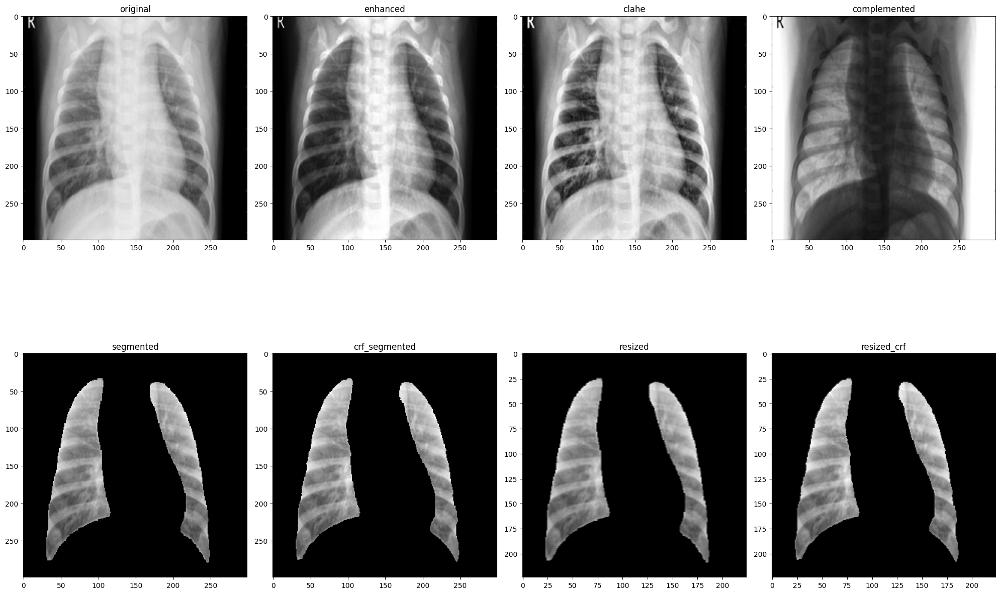

Download link for CRF-processed images:


In [8]:
if __name__ == "__main__":
    # Configuration
    base_dir = '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset'
    output_base_dir = '/kaggle/working/preprocessed_images'
    
    categories = {
        'COVID': {
            'images': os.path.join(base_dir, 'COVID', 'images'),
            'masks': os.path.join(base_dir, 'COVID', 'masks')
        },
        'Lung_Opacity': {
            'images': os.path.join(base_dir, 'Lung_Opacity', 'images'),
            'masks': os.path.join(base_dir, 'Lung_Opacity', 'masks')
        },
        'Normal': {
            'images': os.path.join(base_dir, 'Normal', 'images'),
            'masks': os.path.join(base_dir, 'Normal', 'masks')
        },
        'Viral_Pneumonia': {
            'images': os.path.join(base_dir, 'Viral Pneumonia', 'images'),
            'masks': os.path.join(base_dir, 'Viral Pneumonia', 'masks')
        }
    }

    # Process images
    for category, folders in categories.items():
        print(f"Processing {category}...")
        output_folder = os.path.join(output_base_dir, category)
        process_folder(
            image_folder=folders['images'],
            mask_folder=folders['masks'],
            output_folder=output_folder,
            category_name=category,
            num_samples=3
        )

    # Prepare CRF-processed images for download
    temp_dir = '/kaggle/working/all_resized_crf_folders'
    os.makedirs(temp_dir, exist_ok=True)

    for root, dirs, files in os.walk(output_base_dir):
        if 'resized_crf' in dirs:
            category = os.path.basename(root)
            shutil.copytree(
                os.path.join(root, 'resized_crf'),
                os.path.join(temp_dir, f'{category}_resized_crf'),
                dirs_exist_ok=True
            )

    shutil.make_archive('/kaggle/working/all_resized_crf_folders', 'zip', temp_dir)
    print("Download link for CRF-processed images:")
    FileLink('all_resized_crf_folders.zip')

In [4]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG19, EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import (classification_report, confusion_matrix, 
                           accuracy_score, precision_score, recall_score, f1_score)
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from IPython.display import FileLink

# Configure GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Set mixed precision policy
policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

2025-04-13 16:58:14.854459: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744563494.890669    1271 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744563494.899542    1271 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
# Update these paths to match your Kaggle environment
base_dir = '/kaggle/input/covid19-radiography-database/COVID-19_Radiography_Dataset'
output_dir = '/kaggle/working/dataset_split'

# Create directory structure if it doesn't exist
os.makedirs(os.path.join(output_dir, 'train'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'val'), exist_ok=True)
os.makedirs(os.path.join(output_dir, 'test'), exist_ok=True)

# Verify source directories exist
required_dirs = ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']
for dir_name in required_dirs:
    if not os.path.exists(os.path.join(base_dir, dir_name)):
        raise FileNotFoundError(f"Directory not found: {os.path.join(base_dir, dir_name)}")

# Data Splitting

In [6]:
def split_dataset(base_dir, output_dir, test_size=0.15, val_size=0.15, seed=42):
    """Split dataset into train/val/test sets"""
    for class_name in os.listdir(base_dir):
        class_dir = os.path.join(base_dir, class_name, 'images')
        if not os.path.isdir(class_dir):
            continue
            
        images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        
        # Split into train+val and test
        train_val, test = train_test_split(images, test_size=test_size, random_state=seed)
        
        # Split train_val into train and val
        train, val = train_test_split(train_val, test_size=val_size/(1-test_size), random_state=seed)
        
        # Copy files to output directories
        for split, imgs in zip(['train', 'val', 'test'], [train, val, test]):
            split_dir = os.path.join(output_dir, split, class_name)
            os.makedirs(split_dir, exist_ok=True)
            for img in imgs:
                src = os.path.join(class_dir, img)
                dst = os.path.join(split_dir, img)
                shutil.copy(src, dst)
                
        print(f"Class {class_name}: {len(train)} train, {len(val)} val, {len(test)} test samples")

print("Splitting dataset...")
split_dataset(base_dir, output_dir)

Splitting dataset...
Class Normal: 7134 train, 1529 val, 1529 test samples
Class Lung_Opacity: 4208 train, 902 val, 902 test samples
Class Viral Pneumonia: 941 train, 202 val, 202 test samples
Class COVID: 2530 train, 543 val, 543 test samples


# Data Pipeline

In [7]:
def create_datasets(data_dir, batch_size=32, img_size=(224,224)):
    """Create TensorFlow datasets with proper preprocessing"""
    # Verify directories exist
    for split in ['train', 'val', 'test']:
        if not os.path.exists(os.path.join(data_dir, split)):
            raise FileNotFoundError(f"Directory not found: {os.path.join(data_dir, split)}")
    
    # Load datasets
    train_ds = tf.keras.utils.image_dataset_from_directory(
        os.path.join(data_dir, 'train'),
        image_size=img_size,
        batch_size=batch_size,
        shuffle=True,
        label_mode='categorical',
        seed=42
    )
    
    val_ds = tf.keras.utils.image_dataset_from_directory(
        os.path.join(data_dir, 'val'),
        image_size=img_size,
        batch_size=batch_size,
        shuffle=False,
        label_mode='categorical'
    )
    
    test_ds = tf.keras.utils.image_dataset_from_directory(
        os.path.join(data_dir, 'test'),
        image_size=img_size,
        batch_size=batch_size,
        shuffle=False,
        label_mode='categorical'
    )
    
    # Get class names
    class_names = train_ds.class_names
    
    # Preprocessing function
    def process_image(image, label):
        image = tf.image.convert_image_dtype(image, tf.float32)
        if image.shape[-1] == 1:
            image = tf.image.grayscale_to_rgb(image)
        return image, label
    
    # Apply preprocessing
    train_ds = train_ds.map(process_image)
    val_ds = val_ds.map(process_image)
    test_ds = test_ds.map(process_image)
    
    # Compute class weights
    class_weights = compute_class_weight(
        'balanced',
        classes=np.arange(len(class_names)),
        y=np.concatenate([y.numpy().argmax(axis=1) for x, y in train_ds], axis=0)
    )
    class_weights = dict(enumerate(class_weights))
    
    return train_ds, val_ds, test_ds, class_names, class_weights

print("\nCreating datasets...")
train_ds, val_ds, test_ds, class_names, class_weights = create_datasets(output_dir)
print("\nClass names:", class_names)
print("Class weights:", class_weights)


Creating datasets...
Found 14813 files belonging to 4 classes.


I0000 00:00:1744563561.384699    1271 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9728 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1744563561.385397    1271 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13842 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 3176 files belonging to 4 classes.
Found 3176 files belonging to 4 classes.

Class names: ['COVID', 'Lung_Opacity', 'Normal', 'Viral Pneumonia']
Class weights: {0: 1.4637351778656127, 1: 0.8800499049429658, 2: 0.519098682366134, 3: 3.935441020191286}


# Model Building

In [8]:
def build_model(model_name='VGG19', num_classes=4):
    """Build transfer learning model"""
    if model_name == 'VGG19':
        base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
    elif model_name == 'EfficientNetB0':
        base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224,224,3))
    else:
        raise ValueError("Choose 'VGG19' or 'EfficientNetB0'")
    
    base_model.trainable = False
    
    inputs = tf.keras.Input(shape=(224,224,3))
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
    
    model = tf.keras.Model(inputs, outputs)
    
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# Build models
print("\nBuilding models...")
vgg_model = build_model('VGG19', len(class_names))
effnet_model = build_model('EfficientNetB0', len(class_names))


Building models...


# Training and Evaluation

In [9]:
def print_metrics(y_true, y_pred, class_names):
    """Print metrics with 4 decimal precision"""
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    
    print("\n" + "="*50)
    print("Model Performance Metrics")
    print("="*50)
    print(f"{'Accuracy:':<15}{accuracy:.4f}")
    print(f"{'Precision:':<15}{precision:.4f}")
    print(f"{'Recall:':<15}{recall:.4f}")
    print(f"{'F1-Score:':<15}{f1:.4f}")
    print("="*50 + "\n")
    
    print("Classification Report:")
    print(classification_report(y_true, y_pred, 
                              target_names=class_names,
                              digits=4))

def train_and_evaluate(model, train_ds, val_ds, test_ds, class_weights, model_name, epochs=20):
    """Complete training and evaluation pipeline"""
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
        ModelCheckpoint(f'best_{model_name}.keras',
                      monitor='val_accuracy',
                      save_best_only=True,
                      mode='max'),
        ReduceLROnPlateau(monitor='val_loss',
                         factor=0.2,
                         patience=3,
                         min_lr=1e-6)
    ]
    
    print(f"\nTraining {model_name}...")
    history = model.fit(
        train_ds,
        epochs=epochs,
        validation_data=val_ds,
        class_weight=class_weights,
        callbacks=callbacks,
        verbose=1
    )
    
    # Evaluation
    print(f"\n{'='*50}")
    print(f"Evaluating {model_name}")
    print("="*50)
    
    y_true = np.concatenate([y.numpy().argmax(axis=1) for x, y in test_ds], axis=0)
    y_pred = model.predict(test_ds).argmax(axis=1)
    
    # Print metrics
    print_metrics(y_true, y_pred, class_names)
    
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10,8))
    sns.heatmap(cm, annot=True, fmt='d', 
                xticklabels=class_names,
                yticklabels=class_names,
                cmap='Blues')
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    
    # Training History
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.title('Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    
    plt.subplot(1,2,2)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.title('Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    return history


Training VGG19 Model

Training VGG19...
Epoch 1/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 80s 173ms/step - accuracy: 0.9424 - loss: 0.1151 - val_accuracy: 0.9118 - val_loss: 0.2418 - learning_rate: 4.0000e-06
Epoch 2/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 78s 168ms/step - accuracy: 0.9407 - loss: 0.1224 - val_accuracy: 0.9118 - val_loss: 0.2428 - learning_rate: 4.0000e-06
Epoch 3/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 79s 170ms/step - accuracy: 0.9420 - loss: 0.1139 - val_accuracy: 0.9109 - val_loss: 0.2420 - learning_rate: 4.0000e-06
Epoch 4/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 78s 169ms/step - accuracy: 0.9475 - loss: 0.1155 - val_accuracy: 0.9118 - val_loss: 0.2430 - learning_rate: 4.0000e-06
Epoch 5/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 79s 170ms/step - accuracy: 0.9423 - loss: 0.1171 - val_accuracy: 0.9115 - val_loss: 0.2427 - learning_rate: 1.0000e-06
Epoch 6/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 79s 171ms/step - accuracy: 0.9468 - loss: 0.1153 - val_accuracy: 0.9112 - val_loss: 0.2432 - learning_rate: 1.0000e-06

Eval

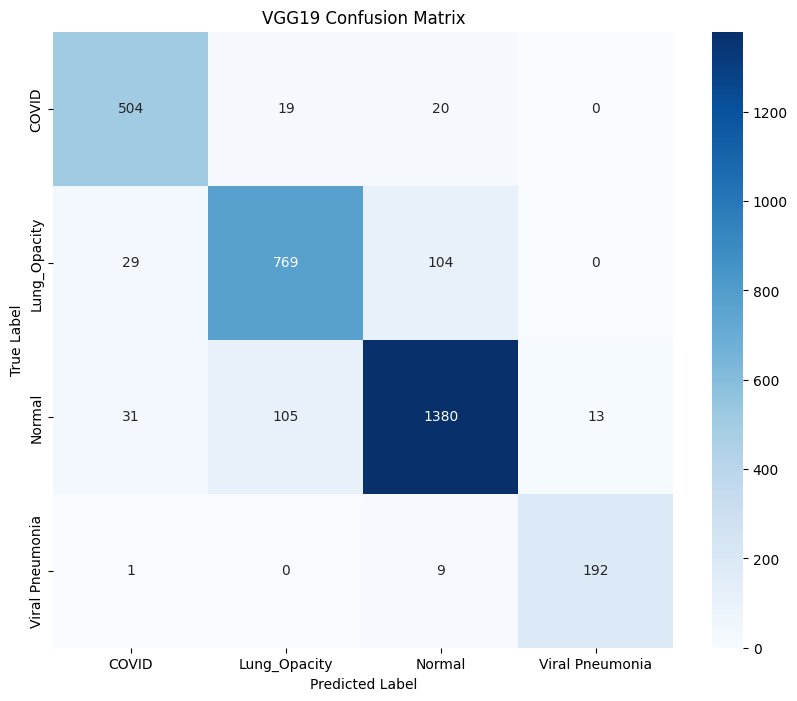

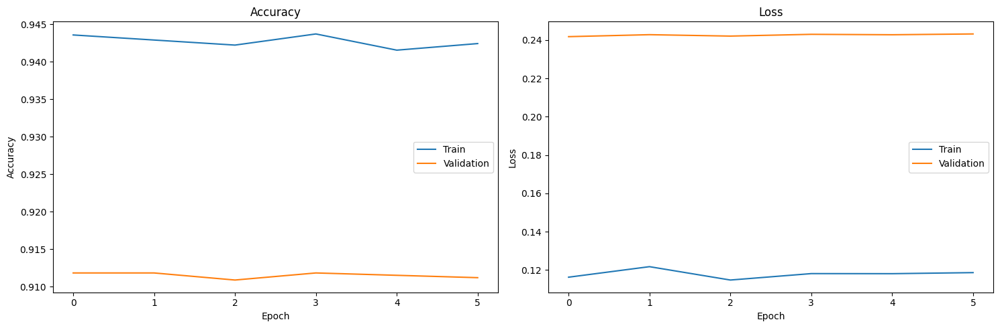

In [19]:
print("\n" + "="*50)
print("Training VGG19 Model")
print("="*50)
vgg_history = train_and_evaluate(vgg_model, train_ds, val_ds, test_ds, 
                               class_weights, 'VGG19', epochs=10)


Training EfficientNetB0 Model

Training EfficientNetB0...
Epoch 1/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 95s 110ms/step - accuracy: 0.6104 - loss: 0.8671 - val_accuracy: 0.7724 - val_loss: 0.5581 - learning_rate: 1.0000e-04
Epoch 2/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - accuracy: 0.7786 - loss: 0.4876 - val_accuracy: 0.8042 - val_loss: 0.4765 - learning_rate: 1.0000e-04
Epoch 3/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - accuracy: 0.8109 - loss: 0.4068 - val_accuracy: 0.8331 - val_loss: 0.4140 - learning_rate: 1.0000e-04
Epoch 4/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - accuracy: 0.8353 - loss: 0.3660 - val_accuracy: 0.8463 - val_loss: 0.3980 - learning_rate: 1.0000e-04
Epoch 5/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - accuracy: 0.8450 - loss: 0.3395 - val_accuracy: 0.8586 - val_loss: 0.3697 - learning_rate: 1.0000e-04
Epoch 6/10
463/463 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.8529 - loss: 0.3220 - val_accuracy: 0.8545 - val_loss: 0.3722 - learning_rate: 1.0

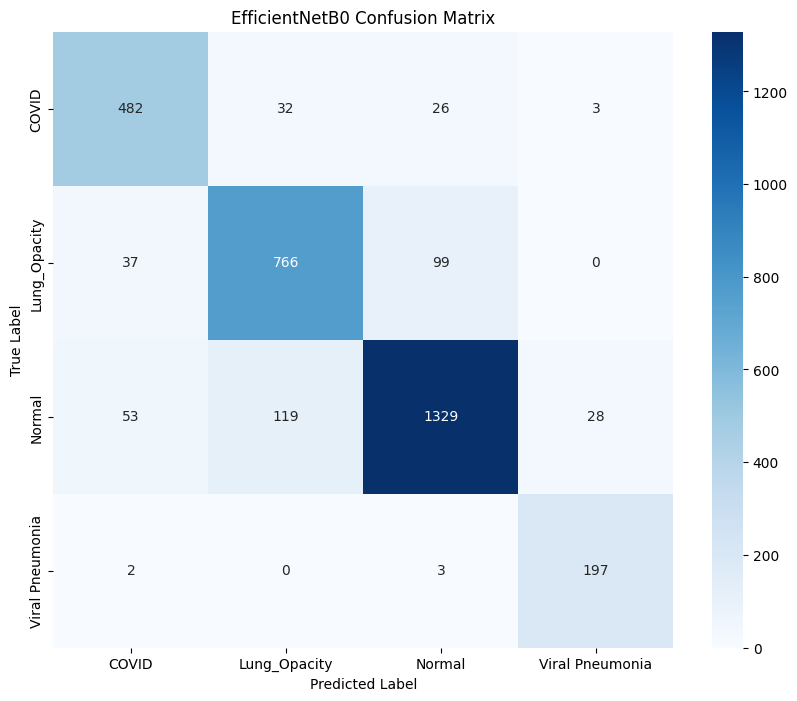

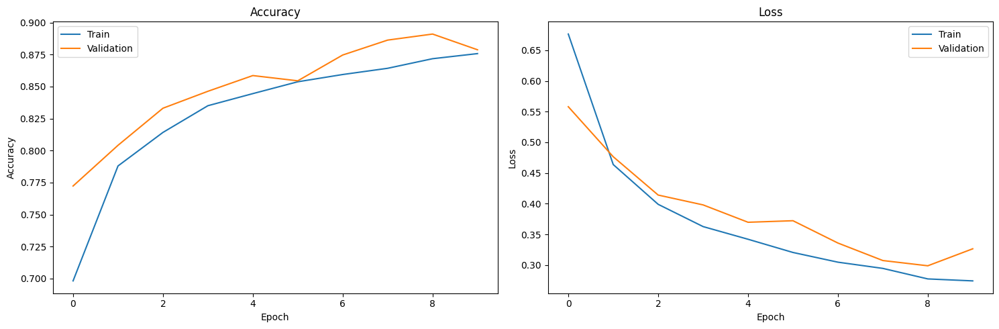

In [20]:
print("\n" + "="*50)
print("Training EfficientNetB0 Model")
print("="*50)
effnet_history = train_and_evaluate(effnet_model, train_ds, val_ds, test_ds,
                                  class_weights, 'EfficientNetB0', epochs=10)